# Classifying Room Occupancy according to <br> Four Environmental Factors

## 1. Introduction
The use of smart-home technology is becoming increasingly prevalent. Household technology such as Alexa, Google Assistant and Siri are an integral aspect of many people’s lives. We want to explore how this technology can utilize simple environmental sensors to better respond to users.

Our dataset, composed of 8143 total observations, analyzes room occupancy based on temperature, humidity, light, and CO2 levels in the room. Occupancy is the categorical variable with two possible outcomes: occupied or unoccupied. We found this dataset interesting due to its suitability for classification, and real-world impact. Specifically, we wanted to analyze the question: "Is the room occupied?" Based on temperature, humidity, light, and CO2 levels. These variables fluctuate based on the presence of a person in a room. The variables are important to test due to being able to “accurately detect the presence of the occupants without using a camera” (Candanedo, 2016).

After thoroughly consulting this literature, we hypothesized an increase in temperature, humidity, light, and CO2 levels when a person occupies a room. We expect a particularly large increase in the light levels because people are likely to turn on a light when they are in a room.

## 2. Preliminary Exploratory Data Analysis

#### Accessing Data

In [1]:
#load in the necessary libraries
library(tidyverse)
library(repr)
library(tidymodels)

#.zip file is downloaded, unzipped and read in
temp <- tempfile()
download.file("https://archive.ics.uci.edu/static/public/357/occupancy+detection.zip",temp)
data <- read.csv(unz(temp, "datatraining.txt"))
unlink(temp)

#data is saved as a tibble for future data wrangling
occupancyData <- tibble(data)
head(occupancyData)

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_co

date,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
2015-02-04 17:51:00,23.18,27.2720,426.0,721.25,0.004792988,1
2015-02-04 17:51:59,23.15,27.2675,429.5,714.00,0.004783441,1
2015-02-04 17:53:00,23.15,27.2450,426.0,713.50,0.004779464,1
2015-02-04 17:54:00,23.15,27.2000,426.0,708.25,0.004771509,1
2015-02-04 17:55:00,23.10,27.2000,426.0,704.50,0.004756993,1
2015-02-04 17:55:59,23.10,27.2000,419.0,701.00,0.004756993,1


#### Selecting Necessary Columns

In [2]:
#date and Humidity Ratio are removed as they are not needed, all other columns are kept

selectedOccupancyData <- occupancyData[,-c(1, 6)]
head(selectedOccupancyData)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.18,27.2720,426.0,721.25,1
23.15,27.2675,429.5,714.00,1
23.15,27.2450,426.0,713.50,1
23.15,27.2000,426.0,708.25,1
23.10,27.2000,426.0,704.50,1
23.10,27.2000,419.0,701.00,1


#### Splitting Data For Training / Testing

In [3]:
# data is split into training and testing sets using a 75/25 split
# A seed is used to ensure reproducibility
set.seed(555)
occupancy_split <- initial_split(selectedOccupancyData, prop = 0.75, strata = Occupancy)  
occupancy_train <- training(occupancy_split)
occupancy_test <- testing(occupancy_split)

head(occupancy_train)
head(occupancy_test)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.000,27.20,0,681.5,0
22.945,27.29,0,685.0,0
22.945,27.39,0,685.0,0
22.890,27.39,0,689.0,0
22.890,27.39,0,689.5,0
22.890,27.50,0,688.0,0


Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.15,27.24500,426,713.5000,1
23.10,27.20000,419,701.0000,1
23.10,27.20000,419,689.3333,1
23.10,27.16667,419,683.5000,1
23.00,27.12500,419,686.0000,1
22.89,27.39000,0,689.0000,0


#### Summarizing the Data
We will provide summarizing statistics on the entire training data set, and then provide the summaries for each variable for a more comprehensive view of the data distribution. 

In [4]:
training_data_summary <- occupancy_train |>
    summarise(Total_Observations = n(),
        Occupancy_Count_0 = sum(Occupancy == 0, na.rm = TRUE),
        Occupancy_Count_1 = sum(Occupancy == 1, na.rm = TRUE))
print("Training Data Summary")
training_data_summary

[1] "Training Data Summary"


Total_Observations,Occupancy_Count_0,Occupancy_Count_1
<int>,<int>,<int>
6106,4810,1296


In [5]:
co2_summary <- occupancy_train |>
    summarize(missing_value = sum(is.na(CO2)), 
              mean = mean(CO2, na.rm = TRUE), 
              median = median(CO2, na.rm=TRUE), 
              standard_deviation = sd(CO2, na.rm =TRUE),
              max_value = max(CO2),
              min_value = min(CO2))
print("CO2 Variable Summary")
co2_summary

[1] "CO2 Variable Summary"


missing_value,mean,median,standard_deviation,max_value,min_value
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,605.8719,453.5,313.8269,2028.5,412.75


In [6]:
light_summary <- occupancy_train |>
    summarize(missing_value = sum(is.na(Light)), 
              mean = mean(Light, na.rm = TRUE), 
              median = median(Light, na.rm=TRUE), 
              standard_deviation = sd(Light, na.rm =TRUE),
              max_value = max(Light),
              min_value = min(Light))
print("Light Variable Summary")
light_summary

[1] "Light Variable Summary"


missing_value,mean,median,standard_deviation,max_value,min_value
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,119.3437,0,194.8323,1546.333,0


In [7]:
humidity_summary <- occupancy_train |>
    summarize(missing_value = sum(is.na(Humidity)), 
              mean = mean(Humidity, na.rm = TRUE), 
              median = median(Humidity, na.rm=TRUE), 
              standard_deviation = sd(Humidity, na.rm =TRUE),
              max_value = max(Humidity),
              min_value = min(Humidity))
print("Humidity Variable Summary")
humidity_summary

[1] "Humidity Variable Summary"


missing_value,mean,median,standard_deviation,max_value,min_value
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,25.73559,26.245,5.501405,39.1175,16.745


In [8]:
temperature_summary <- occupancy_train |>
    summarize(missing_value = sum(is.na(Temperature)), 
              mean = mean(Temperature, na.rm = TRUE), 
              median = median(Temperature, na.rm=TRUE), 
              standard_deviation = sd(Temperature, na.rm =TRUE),
              max_value = max(Temperature),
              min_value = min(Temperature))
print("Temperature Variable Summary")
temperature_summary

[1] "Temperature Variable Summary"


missing_value,mean,median,standard_deviation,max_value,min_value
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,20.6126,20.39,1.020415,23.18,19


#### Visualizing the Data

Each of these 4 graphs is ultimately the same, except for having different values on the x-axis (denoted in title of each graph). These graphs are useful to show the distribution of our different predictor variables and how they are distributed among the two y-axis cases of the room being occupied vs unoccupied.

Note the usage of a jitter-plot instead of a typical scatter plot, as many of the values would otherwise overlap and make it harder to understand the distribution of points.

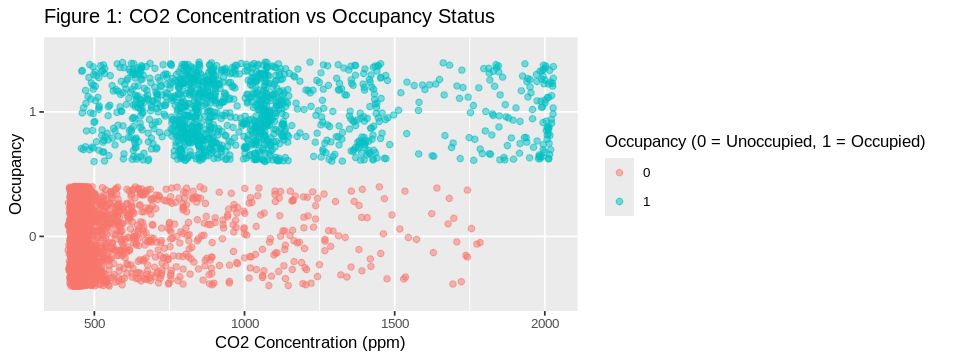

In [9]:
options(repr.plot.width=8, repr.plot.height=3)
co2_plot <- occupancy_train |>
    ggplot(aes(x=CO2, y=as_factor(Occupancy), color=as_factor(Occupancy))) +
    geom_jitter(alpha=0.5, width=0.1) +
    labs(x = "CO2 Concentration (ppm)", y = "Occupancy", color="Occupancy (0 = Unoccupied, 1 = Occupied)", title = "Figure 1: CO2 Concentration vs Occupancy Status") +
    theme(text=element_text(size=10))
co2_plot

Increased CO2 concentration generally indicates an occupied state. The baseline CO2 concentration for an unoccupied room is around 500 ppm, while the CO2 concentration for occupied rooms ranges from 750 ppm to 1200 ppm.

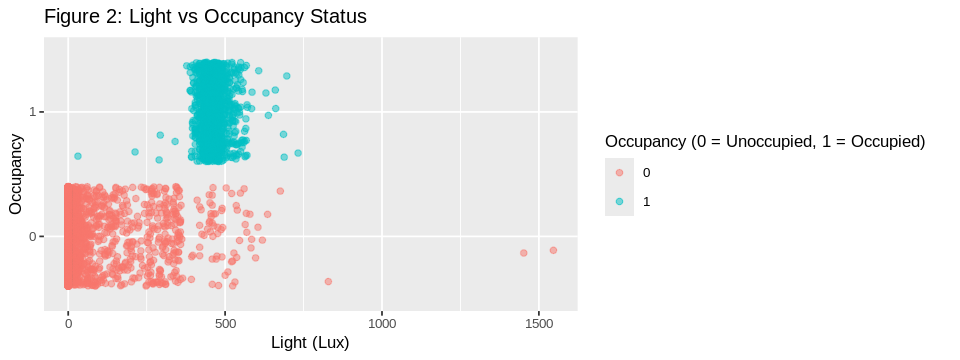

In [10]:
light_plot <- occupancy_train |>
    ggplot(aes(x=Light, y=as_factor(Occupancy), color=as_factor(Occupancy))) +
    geom_jitter(alpha=0.5, width=0.1) +
    labs(x = "Light (Lux)", y = "Occupancy", color="Occupancy (0 = Unoccupied, 1 = Occupied)", title = "Figure 2: Light vs Occupancy Status") +
    theme(text=element_text(size=10))
light_plot

Increased light intensity clearly indicates an occupied state. When the room is unoccupied, the light intensity is zero (no lights on); when the room is occupied, the light intensity is around 450 lux.

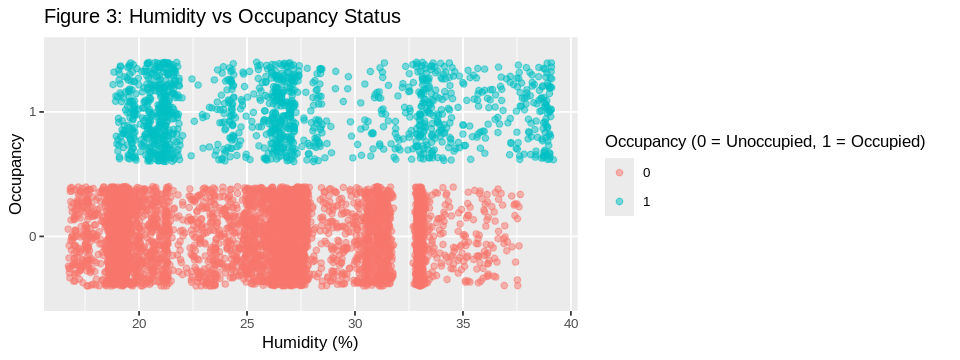

In [11]:
humidity_plot <- occupancy_train |>
    ggplot(aes(x=Humidity, y=as_factor(Occupancy), color=as_factor(Occupancy))) +
    geom_jitter(alpha=0.5, width=0.1) +
    labs(x = "Humidity (%)", y = "Occupancy", color="Occupancy (0 = Unoccupied, 1 = Occupied)", title = "Figure 3: Humidity vs Occupancy Status") +
    theme(text=element_text(size=10))
humidity_plot

Humidity percentage is moderately correlated to occupancy status, generally, a higher humidity level indicates an occupied state. Unoccupied rooms have a wide range of humidity values from 18% to 32%, while occupied rooms tend to show specific humidity of around 22%, 27%, 33% or 38%.

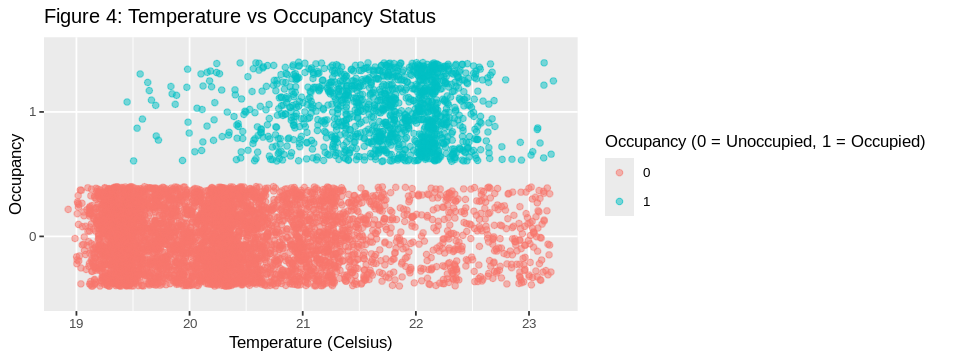

In [12]:
temp_plot <- occupancy_train |>
    ggplot(aes(x=Temperature, y=as_factor(Occupancy), color=as_factor(Occupancy))) +
    geom_jitter(alpha=0.5, width=0.1) +
    labs(x = "Temperature (Celsius)", y = "Occupancy", color="Occupancy (0 = Unoccupied, 1 = Occupied)", title = "Figure 4: Temperature vs Occupancy Status") +
    theme(text=element_text(size=10))
temp_plot

Increased temperature generally indicates an occupied state. The temperature for unoccupied rooms ranges from 19 Celsius to 21.5 Celsius, while the temperature for occupied rooms mainly ranges from 21.5 Celsius to 22.5 Celsius.

## 3. Methods
We will begin by importing the Occupancy Detection dataset into Jupyter, focusing on Temperature, Humidity, Light, and CO2 to forecast room occupancy, while discarding “date” and “Humidity Ratio” to avoid redundancy and overemphasis on humidity in our KNN model. After preprocessing, the dataset will be divided into a 75% training set and a 25% testing set. We’ll determine the optimal K for the KNN model by performing cross-validation with 5 folds on the training data, incorporating a preprocessing recipe and the KNN model with a tunable K parameter. The K yielding the highest accuracy will be selected for retraining the KNN classifier on the full training dataset before making predictions on the test set. Finally, we will use a confusion matrix and a stacked bar graph comparing predicted to actual occupancy to assess the model’s performance.

## 4. Expected Outcomes and Significance
We expect higher humidities, temperatures, light and CO2 levels when a room is occupied. These findings could be utilized by household technology companies, allowing them to develop automatic lighting systems that incorporate more efficient sensors, thus improving the accuracy of occupancy detection for better lighting control. This study is not only limited to temperature, humidity, light, and CO2 levels; future studies could explore other measurements such as oxygen levels, noise levels, or dust particles in the room. By analyzing more variables, the occupancy detection of household systems will be optimized, significantly boosting the quality of life of millions around the world.

## 5. Training Classification and Testing Individual Variables

In [13]:
# Mutate both training and testing data to convert the Occupancy column to a factor rather than an integer
occupancy_train <- occupancy_train |>
    mutate(Occupancy = factor(Occupancy))
occupancy_test <- occupancy_test |>
    mutate(Occupancy = factor(Occupancy))


options(repr.plot.width=8, repr.plot.height=6)
# Create a recipe for each predictor
recipe_temp <- recipe(Occupancy ~ Temperature, data = occupancy_train)
recipe_hum <- recipe(Occupancy ~ Humidity, data = occupancy_train)
recipe_light <- recipe(Occupancy ~ Light, data = occupancy_train)
recipe_co2 <- recipe(Occupancy ~ CO2, data = occupancy_train)

# Set up the knn specification
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
    set_engine("kknn") |>
    set_mode("classification")

# Set up the resampling
folds <- vfold_cv(occupancy_train, v = 5)

# Create a function to tune and evaluate the model for a given recipe
tune_and_evaluate <- function(recipe) {
  results <- workflow() |>
    add_recipe(recipe) |>
    add_model(knn_spec) |>
    tune_grid(resamples = folds, grid = tibble(neighbors = 1:10)) |>
    collect_metrics() |>
    filter(.metric == "accuracy")
  return(results)
}

# Evaluate each predictor
results_temp <- tune_and_evaluate(recipe_temp)
results_hum <- tune_and_evaluate(recipe_hum)
results_light <- tune_and_evaluate(recipe_light)
results_co2 <- tune_and_evaluate(recipe_co2)

Now we have accuracy data for each of our individual predictor variables, and we can check the best number of neighbours, as well as the max accuracy when using a single variable. This is valuable data as it allows us to make several more predictions about our final model before it is finalized, and understand the data we're working with.

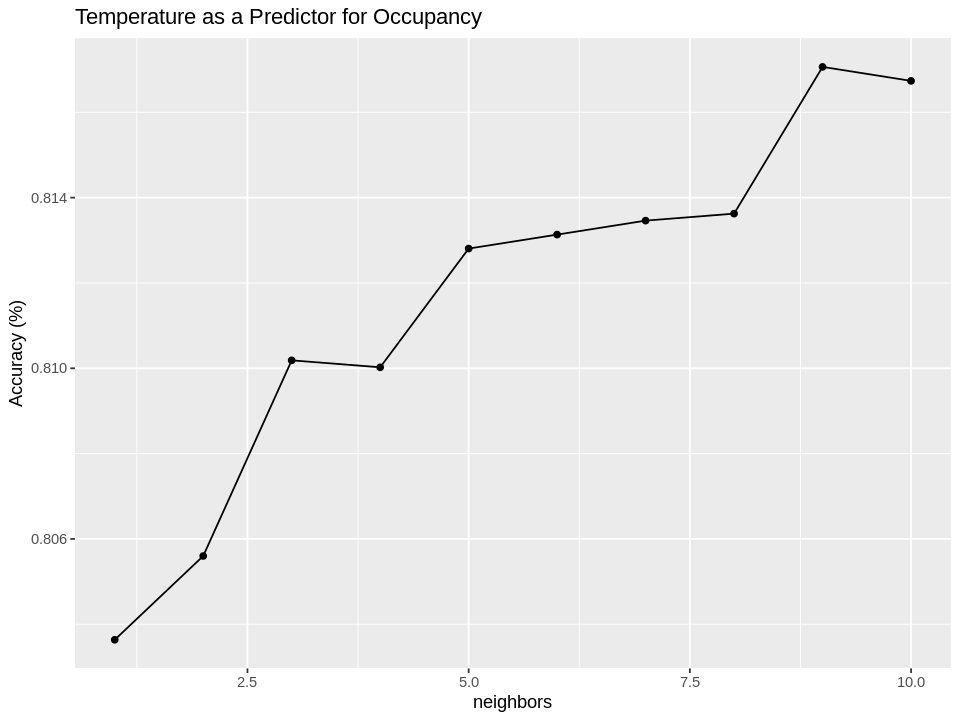

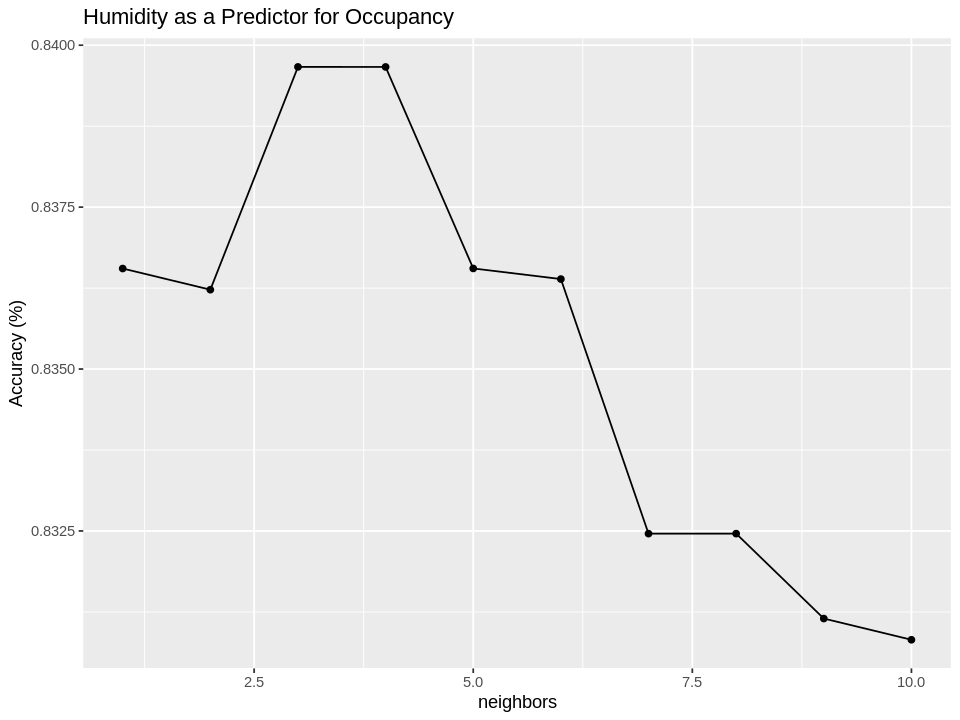

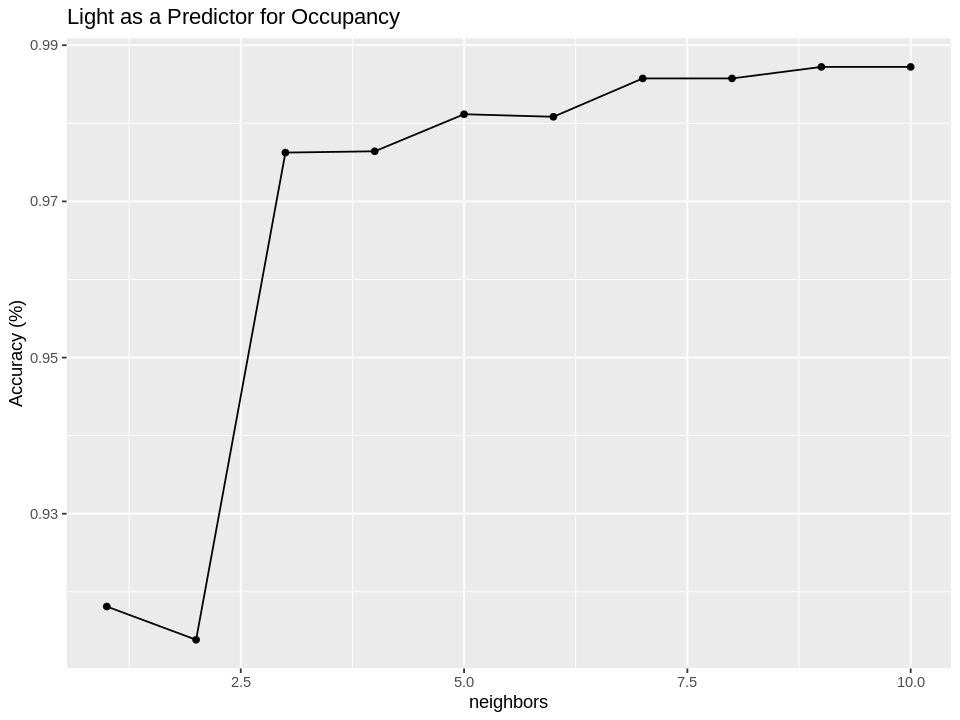

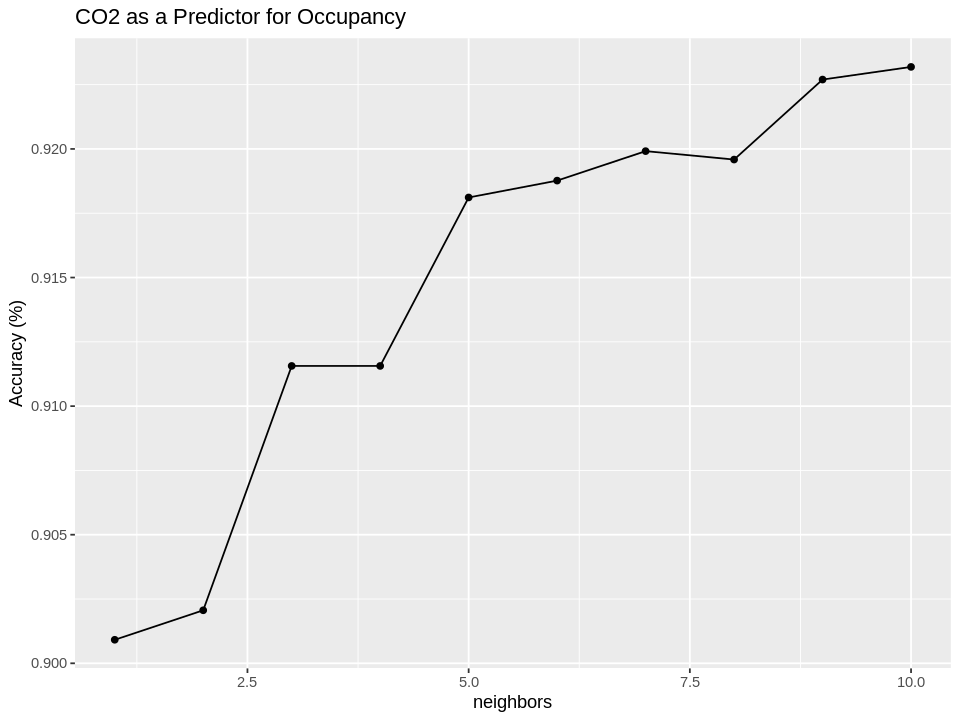

In [14]:
# Plot the results and look at the accuracy to compare
ggplot(results_temp, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("Temperature as a Predictor for Occupancy") +
    ylab("Accuracy (%)")

ggplot(results_hum, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("Humidity as a Predictor for Occupancy") +
    ylab("Accuracy (%)")

ggplot(results_light, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("Light as a Predictor for Occupancy") +
    ylab("Accuracy (%)")

ggplot(results_co2, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("CO2 as a Predictor for Occupancy") +
    ylab("Accuracy (%)")


In [15]:
cat("Highest accuracy for temperature is", max(results_temp$mean), "at", which.max(results_temp$mean), "neighbours.\n")
cat("Highest accuracy for humidity is", max(results_hum$mean), "at", which.max(results_hum$mean), "neighbours.\n")
cat("Highest accuracy for light is", max(results_light$mean), "at", which.max(results_light$mean), "neighbours.\n")
cat("Highest accuracy for CO2 is", max(results_co2$mean), "at", which.max(results_co2$mean), "neighbours.\n")

Highest accuracy for temperature is 0.8170644 at 9 neighbours.
Highest accuracy for humidity is 0.8396647 at 3 neighbours.
Highest accuracy for light is 0.9872253 at 9 neighbours.
Highest accuracy for CO2 is 0.9231894 at 10 neighbours.


From our outputs it's clearly visible that, when using a single variable, light is the most accurate at 98.7% with 9 neighbours being used to predict the value. The least accurate predictor variable at 81.7% is temperature.
Looking at the graphs and the printed output values, the best value k for number of neighbours is 3, 9, 9, 10. Averaging these out we get about 8/9, but since the two most accurate predictors have higher values, it's very possible that when training our model using all variables our k will be 8, 9, or 10.

The next step is to train a classification model using all 4 predictor variables.

neighbors,.metric,.estimator,mean,n,std_err,.config
<int>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9923025,5,0.0016299800,Preprocessor1_Model01
2,accuracy,binary,0.9923025,5,0.0016299800,Preprocessor1_Model02
3,accuracy,binary,0.9931215,5,0.0011755625,Preprocessor1_Model03
4,accuracy,binary,0.9931215,5,0.0011755625,Preprocessor1_Model04
5,accuracy,binary,0.9932851,5,0.0011982877,Preprocessor1_Model05
6,accuracy,binary,0.9932851,5,0.0011982877,Preprocessor1_Model06
7,accuracy,binary,0.9918111,5,0.0008594870,Preprocessor1_Model07
8,accuracy,binary,0.9918111,5,0.0008594870,Preprocessor1_Model08
9,accuracy,binary,0.9913199,5,0.0009897698,Preprocessor1_Model09


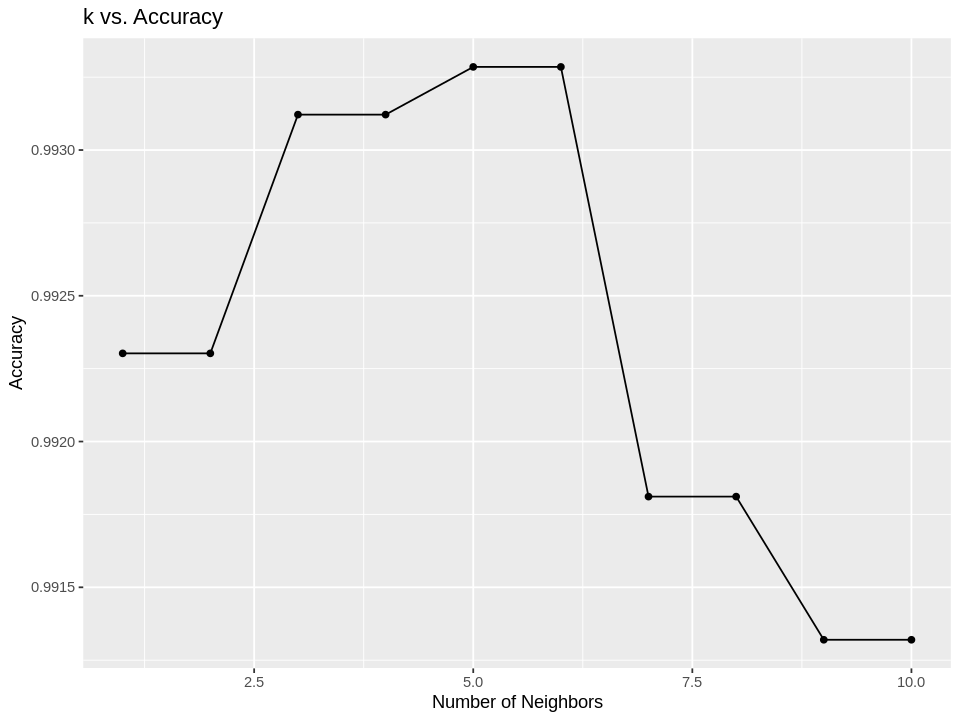

In [16]:
recipe <- recipe(Occupancy ~ ., data = occupancy_train)


knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
    set_engine("kknn") |>
    set_mode("classification")

folds <- vfold_cv(occupancy_train, v = 5)

results <- workflow() |>
    add_recipe(recipe) |>
    add_model(knn_spec) |>
    tune_grid(resamples = folds, grid = tibble(neighbors = 1:10)) |>
    collect_metrics()

results <- filter(results, .metric == "accuracy")

cross_val_plot <- ggplot(results, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    labs(x = "Number of Neighbors", y = "Accuracy", title = "k vs. Accuracy")

cross_val_plot
results

It seems the best k-value is 5 or 6 (same accuracy), which provices an accuracy of 99.33%
We'll further discuss the results after we finalize our model and make a confusion matrix.

In [17]:
occup_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 6) |>
    set_engine("kknn") |>
    set_mode("classification")

occup_fit <- workflow() |>
    add_recipe(recipe) |>
    add_model(occup_spec) |>
    fit(data = occupancy_train)

occup_predictions <- predict(occup_fit, new_data = occupancy_test)

occup_metrics <- occupancy_test |>
    bind_cols(occup_predictions) |>
    metrics(truth = Occupancy, estimate = .pred_class)

accuracy <- occup_metrics |> 
    filter(.metric == "accuracy")

accuracy


occup_conf_mat <- occupancy_test |>
    bind_cols(occup_predictions) |>
    conf_mat(truth = Occupancy, estimate = .pred_class)


occup_conf_mat

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.994109


          Truth
Prediction    0    1
         0 1598    6
         1    6  427

Finally, we have:

Accuracy = (TP + TN) / (TP + TN + FP + FN)
= (427 + 1598) / (427 + 1598 + 6 + 6)
= (2025) / (2037)
= 99.41%

The accuracy represents the overall likelihood that the prediction is correct.

Recall = TP/(TP + FN)
= 427 / (427 + 6)
= 427 / 433
= 98.61%

The recall represents the likelihood of correctly predicting a room as being occupied when it is, which is important to not annoy users and activate when a room is occupied.

Specificity or "True Negative Rate" = TN / (TN + FP)
= 1598 / (1598 + 6)
= 1598 / 1604
= 99.63%

The specificity measures the ability to correctly predict a room as being empty, which is especially important to avoid false alarms or unnecessary energy consumption.



We have visualized this data below to make it easy to see just how accurate our model is:city measures the a

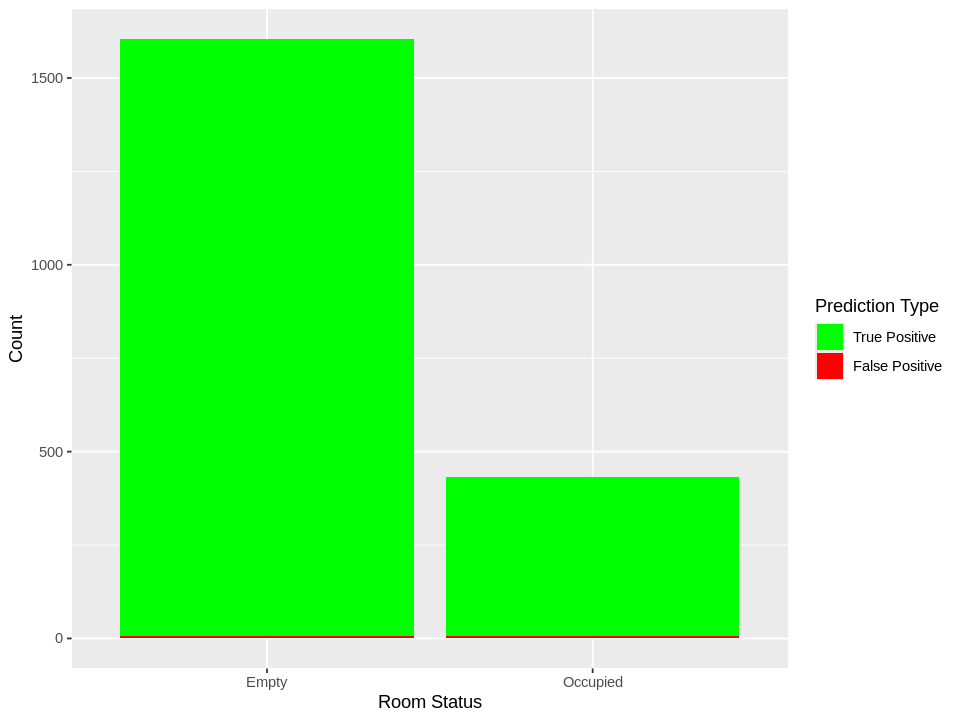

In [21]:
# Values from the confusion matrix
TP <- 427
TN <- 1598
FP <- 6
FN <- 6

# Data frame for plotting
data <- data.frame(
    Category = rep(c('Occupied', 'Empty'), each = 2),
    Count = c(TP, FN, TN, FP),
    Type = rep(c('True Positive', 'False Positive'), times = 2)
)

# Reorder levels to stack the bars correctly
data$Type <- factor(data$Type, levels = c('True Positive', 'False Positive'))

# Plot the stacked bar chart
ggplot(data, aes(x = Category, y = Count, fill = Type)) +
    geom_bar(stat = "identity") +
    labs(x = "Room Status", y = "Count", fill = "Prediction Type") +
    scale_fill_manual(values = c('True Positive' = 'green', 'False Positive' = 'red'))

## 6. Discussion
After running the data through our established model, we found the results of the test to be similar to our predicted model. After arriving at our results, we found our predictions to be supported by the data. We hypothesized that all tested variables would increase when the room was occupied; this was apparent in both the training and testing data. 

In consideration of the most predictive variables, we attempted to qualitatively examine Figure 1 and Figure 4 due to their seemingly predictive results. Before doing this however, we decided that it would be more beneficial to utilize the recall function to statistically determine the second most predictive variable. Through the use of the accuracy function, we found that the most predictive variables in order to be: light, CO2, humidity, and temperature. Notably, we found that consideration of all variables had a result of 99% with the use of the recall function. The incorporation of all variables was the best at predicting occupancy. Through our analysis, we were surprised to find that temperature was the least predictive of occupancy. 

In our analysis of the data, we found that the most predictive variable for occupancy in a room is light level. The average lux of a room when occupied is 450, while the average lux of the room is zero when unoccupied. We believe this to be the case because people tend to turn on the lights of a room when they enter and turn them off when they leave. Although the data in the light analysis is very divisive, we also found this variable to have the least useful implications for the further development of home technology. Light cannot be the sole predictor to the occupancy of a room because there are some instances such as when people sleep with the lights off, in which light levels will be low despite the occupation to the room. 

In our predictions, we expected temperature to be a more reliable variable. However, it was comparatively the worst predictor tested. This outcome could be due to the room being too large for a single person to affect the temperature of the room, and therefore gives the factor more variability. Nevertheless, despite temperature being the least predictive variable, the accuracy of the variable was still over 81%;  a reasonable accuracy, and should still be considered along with the other variables when predicting occupancy. To improve the accuracy of predicting occupancy based on temperature, future studies could measure the occupancy of a room based on relative temperatures over a period of time. For example, if a room temperature increases through time, it would likely mean that a person has entered the room. This is likely to be more effective than measuring the temperature at an instantaneous time. 

Overall, these findings could be utilized by household technology and security companies, allowing them to develop automatic lighting systems and security systems respectively. These companies can then incorporate more efficient sensors, thus improving the accuracy of occupancy detection. Based on our study, we found that the most effective sensors to incorporate in the detectors are light sensors, while the least effective are temperature-based. 
Future studies could explore other measurements such as oxygen levels, noise levels, or dust particles in the room. Studies could additionally consider other types of rooms in different climates or sizes. According to Dokhnyak & Vysotska, after researching the trends of “smart home” devices, they found that household assistant systems will “gain popularity every year, especially regarding the [improvement of] security and safety of their own homes” (2021). By analyzing more variables, the occupancy detection of household systems will be optimized, significantly boosting the quality of life of millions around the world.

## 7. References
1. Candanedo, L. M., & Feldheim, V. (2016). Accurate occupancy detection of an office room from light, temperature, humidity and C|O2 measurements using statistical learning models. Energy and buildings, 112, 28-39.

2. Dokhnyak, B., & Vysotska, V. (2021). Intelligent Smart Home System Using Amazon Alexa Tools. In MoMLeT+ DS (pp. 441-464).